In [ ]:
from google.colab import drive
import os

print("="*70)
print("MONTANDO GOOGLE DRIVE")
print("="*70)

# Montar Drive
drive.mount('/content/drive')

# Definir directorios
DRIVE_MODEL_DIR = '/content/drive/MyDrive/tree_rings_models'
MODEL_PATH = f'{DRIVE_MODEL_DIR}/best_model_phase1.keras'

# Verificar que el modelo existe
if os.path.exists(MODEL_PATH):
    print(f"\n✅ Modelo encontrado: {MODEL_PATH}")
    size_mb = os.path.getsize(MODEL_PATH) / (1024 * 1024)
    print(f"   Tamaño: {size_mb:.1f} MB")
else:
    print(f"\n❌ ERROR: No se encontró el modelo en {MODEL_PATH}")
    print("   Verifica la ubicación del archivo.")

print("="*70)

MONTANDO GOOGLE DRIVE
Mounted at /content/drive

✅ Modelo encontrado: /content/drive/MyDrive/tree_rings_models/best_model_phase1.keras
   Tamaño: 306.7 MB


In [ ]:
# Desinstalar versiones antiguas
!pip uninstall tensorflow tf-keras -y -q

# Instalar TensorFlow 2.19.0 (misma versión del entrenamiento)
!pip install "tensorflow==2.19.0" -q

print("✅ TensorFlow 2.19.0 instalado")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.0/645.0 MB 2.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.12.0 requires tf_keras~=2.19, which is not installed.
dopamine-rl 4.1.2 requires tf-keras>=2.18.0, which is not installed.
✅ TensorFlow 2.19.0 instalado


In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import cv2
import json
import requests
import concurrent.futures
from tqdm import tqdm
import matplotlib.pyplot as plt
import os

print("="*70)
print("LIBRERÍAS IMPORTADAS")
print("="*70)
print(f"TensorFlow version: {tf.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"OpenCV version: {cv2.__version__}")
print("="*70)

LIBRERÍAS IMPORTADAS
TensorFlow version: 2.19.0
NumPy version: 2.0.2
OpenCV version: 4.12.0


In [ ]:
print("="*70)
print("CARGANDO METADATOS")
print("="*70)

# URLs de los archivos CSV
images_csv_url = "https://apache-spark-perception-tree-rings.edducode.me/metadata/raw-images-urls.csv"
jsons_csv_url = "https://apache-spark-perception-tree-rings.edducode.me/metadata/ring_annotations_urls.csv"

# Cargar los DataFrames
df_images = pd.read_csv(images_csv_url)
df_jsons = pd.read_csv(jsons_csv_url)

print(f"✅ Se cargaron {len(df_images)} registros de imágenes")
print(f"✅ Se cargaron {len(df_jsons)} registros de JSONs")

# Crear la clave común (parent_id)
df_images['parent_id'] = df_images['filename'].apply(lambda x: os.path.splitext(x)[0])
df_jsons['parent_id'] = df_jsons['filename'].apply(lambda x: os.path.splitext(x)[0])

# Unir los DataFrames
df_master = pd.merge(
    df_images,
    df_jsons,
    on='parent_id',
    suffixes=('_image', '_json')
)

print(f"\n✅ Se encontraron {len(df_master)} pares (Imagen + JSON)")
print("\nVista previa:")
print(df_master[['parent_id', 'url_image', 'url_json']].head())
print("="*70)

CARGANDO METADATOS
✅ Se cargaron 64 registros de imágenes
✅ Se cargaron 64 registros de JSONs

✅ Se encontraron 64 pares (Imagen + JSON)

Vista previa:
  parent_id                                          url_image  \
0      F02a  https://apache-spark-perception-tree-rings.edd...   
1      F02b  https://apache-spark-perception-tree-rings.edd...   
2      F02c  https://apache-spark-perception-tree-rings.edd...   
3      F02d  https://apache-spark-perception-tree-rings.edd...   
4      F02e  https://apache-spark-perception-tree-rings.edd...   

                                            url_json  
0  https://apache-spark-perception-tree-rings.edd...  
1  https://apache-spark-perception-tree-rings.edd...  
2  https://apache-spark-perception-tree-rings.edd...  
3  https://apache-spark-perception-tree-rings.edd...  
4  https://apache-spark-perception-tree-rings.edd...  


In [ ]:
print("="*70)
print("DESCARGANDO IMÁGENES Y ANOTACIONES")
print("="*70)

# Configuración de descarga
RAW_IMAGE_DIR = '/content/raw_images/'
JSON_DIR = '/content/annotations/'
MAX_WORKERS = 32

os.makedirs(RAW_IMAGE_DIR, exist_ok=True)
os.makedirs(JSON_DIR, exist_ok=True)

print(f"\n✅ Directorios de salida listos:")
print(f"   Imágenes → {RAW_IMAGE_DIR}")
print(f"   JSONs → {JSON_DIR}")

# Función de descarga
def download_pair(row):
    """Descarga un par (imagen, json)"""
    try:
        image_url = row['url_image']
        json_url = row['url_json']
        image_filename = row['filename_image']
        json_filename = row['filename_json']

        local_image_path = os.path.join(RAW_IMAGE_DIR, image_filename)
        local_json_path = os.path.join(JSON_DIR, json_filename)

        # Descargar Imagen (si no existe)
        if not os.path.exists(local_image_path):
            response_img = requests.get(image_url, timeout=15)
            response_img.raise_for_status()
            with open(local_image_path, 'wb') as f:
                f.write(response_img.content)

        # Descargar JSON (si no existe)
        if not os.path.exists(local_json_path):
            response_json = requests.get(json_url, timeout=15)
            response_json.raise_for_status()
            with open(local_json_path, 'wb') as f:
                f.write(response_json.content)

        return local_image_path, local_json_path
    except Exception as e:
        return None, None

# Ejecutar descarga en paralelo
print("\n🔄 Iniciando descarga...")
tasks = [row for index, row in df_master.iterrows()]
local_image_paths = [None] * len(tasks)
local_json_paths = [None] * len(tasks)

with concurrent.futures.ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
    future_to_index = {executor.submit(download_pair, task): i for i, task in enumerate(tasks)}

    for future in tqdm(concurrent.futures.as_completed(future_to_index),
                       total=len(tasks),
                       desc="Descargando pares"):
        index = future_to_index[future]
        try:
            img_path, json_path = future.result()
            local_image_paths[index] = img_path
            local_json_paths[index] = json_path
        except Exception as e:
            print(f"Error en tarea {index}: {e}")

# Crear DataFrame final con rutas locales
df_master['local_image_path'] = local_image_paths
df_master['local_json_path'] = local_json_paths

# Limpiar filas donde falló la descarga
original_count = len(df_master)
df_master = df_master.dropna(subset=['local_image_path', 'local_json_path'])
failed_count = original_count - len(df_master)

print("\n" + "="*70)
print("✅ DESCARGA COMPLETADA")
print("="*70)
if failed_count > 0:
    print(f"⚠️  {failed_count} pares no pudieron descargarse")
print(f"✅ Total de pares listos: {len(df_master)}")
print("\nDataFrame final:")
print(df_master[['parent_id', 'local_image_path', 'local_json_path']].head())
print("="*70)

DESCARGANDO IMÁGENES Y ANOTACIONES

✅ Directorios de salida listos:
   Imágenes → /content/raw_images/
   JSONs → /content/annotations/

🔄 Iniciando descarga...


Descargando pares: 100%|██████████| 64/64 [00:00<00:00, 140102.01it/s]


✅ DESCARGA COMPLETADA
✅ Total de pares listos: 64

DataFrame final:
  parent_id              local_image_path                 local_json_path
0      F02a  /content/raw_images/F02a.png  /content/annotations/F02a.json
1      F02b  /content/raw_images/F02b.png  /content/annotations/F02b.json
2      F02c  /content/raw_images/F02c.png  /content/annotations/F02c.json
3      F02d  /content/raw_images/F02d.png  /content/annotations/F02d.json
4      F02e  /content/raw_images/F02e.png  /content/annotations/F02e.json


In [ ]:
print("="*70)
print("CARGANDO MODELO")
print("="*70)

# Definir las funciones de pérdida y métricas personalizadas
LOSS_FUNCTION = tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    from_logits=False
)

IOU_METRIC = tf.keras.metrics.BinaryIoU(
    target_class_ids=[1],
    threshold=0.5,
    name="iou_anillos"
)

# Cargar el modelo
print(f"\n🔄 Cargando modelo desde: {MODEL_PATH}")
model = tf.keras.models.load_model(
    MODEL_PATH,
    custom_objects={
        'BinaryFocalCrossentropy': LOSS_FUNCTION,
        'BinaryIoU': IOU_METRIC
    }
)

print(f"✅ Modelo cargado exitosamente")
print(f"\n📊 Arquitectura del modelo:")
print(f"   - Entrada: {model.input_shape}")
print(f"   - Salida: {model.output_shape}")
print(f"   - Parámetros totales: {model.count_params():,}")
print("="*70)

CARGANDO MODELO

🔄 Cargando modelo desde: /content/drive/MyDrive/tree_rings_models/best_model_phase1.keras
✅ Modelo cargado exitosamente

📊 Arquitectura del modelo:
   - Entrada: (None, 800, 800, 3)
   - Salida: (None, 800, 800, 1)
   - Parámetros totales: 42,441,761


In [ ]:
def generate_mask_from_json(json_path, image_shape):
    """
    Genera una máscara binaria dibujando los anillos desde las coordenadas del JSON.

    Args:
        json_path: Ruta al archivo JSON con las anotaciones
        image_shape: Tupla (height, width) de la imagen original

    Returns:
        Máscara binaria numpy array (H, W) con valores 0-255
    """
    h, w = image_shape
    mask = np.zeros((h, w), dtype=np.uint8)

    try:
        with open(json_path, 'r') as f:
            data = json.load(f)

        # Dibujar cada anillo (shape) en la máscara
        thickness = 2  # Grosor de línea (igual que en el entrenamiento)
        for shape in data['shapes']:
            points = np.array(shape['points'], dtype=np.int32)
            cv2.polylines(mask, [points], isClosed=True, color=255, thickness=thickness)

        return mask

    except Exception as e:
        print(f"❌ Error generando máscara desde {json_path}: {e}")
        return mask

print("✅ Función de generación de máscara desde JSON definida")

✅ Función de generación de máscara desde JSON definida


In [ ]:
def predict_full_image(model, image_path, patch_size=800):
    """
    Predice la máscara completa de una imagen procesándola por parches.

    Args:
        model: Modelo de Keras cargado
        image_path: Ruta a la imagen
        patch_size: Tamaño del parche (800x800)

    Returns:
        Máscara predicha (H, W) con valores 0-255
    """
    # Cargar imagen
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError(f"No se pudo leer la imagen: {image_path}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Crear máscara de salida
    output_mask = np.zeros((h, w), dtype=np.float32)
    count_mask = np.zeros((h, w), dtype=np.float32)  # Para contar cuántas veces se predice cada píxel

    # Calcular número de parches necesarios (sin overlap)
    num_patches_h = int(np.ceil(h / patch_size))
    num_patches_w = int(np.ceil(w / patch_size))

    total_patches = num_patches_h * num_patches_w

    print(f"   Imagen: {h}x{w} → {num_patches_h}x{num_patches_w} parches ({total_patches} total)")

    # Iterar sobre todos los parches
    patch_count = 0
    for i in range(num_patches_h):
        for j in range(num_patches_w):
            # Calcular coordenadas del parche
            y_start = i * patch_size
            x_start = j * patch_size
            y_end = min(y_start + patch_size, h)
            x_end = min(x_start + patch_size, w)

            # Extraer parche (puede ser más pequeño en los bordes)
            patch = img[y_start:y_end, x_start:x_end]
            patch_h, patch_w = patch.shape[:2]

            # Si el parche es más pequeño que patch_size, hacer padding
            if patch_h < patch_size or patch_w < patch_size:
                padded_patch = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
                padded_patch[:patch_h, :patch_w] = patch
                patch = padded_patch

            # Normalizar y predecir
            patch_normalized = patch.astype(np.float32) / 255.0
            patch_batch = np.expand_dims(patch_normalized, axis=0)

            pred_mask = model.predict(patch_batch, verbose=0)[0, :, :, 0]

            # Recortar la predicción al tamaño real del parche (sin padding)
            pred_mask = pred_mask[:patch_h, :patch_w]

            # Acumular en la máscara de salida
            output_mask[y_start:y_end, x_start:x_end] += pred_mask
            count_mask[y_start:y_end, x_start:x_end] += 1.0

            patch_count += 1

    # Promediar las predicciones (en caso de overlap futuro)
    output_mask = output_mask / np.maximum(count_mask, 1.0)

    # Binarizar (threshold 0.5) y convertir a 0-255
    output_mask_binary = (output_mask > 0.5).astype(np.uint8) * 255

    return output_mask_binary

print("✅ Función de predicción por parches definida")

✅ Función de predicción por parches definida


In [ ]:
def calculate_metrics(mask_pred, mask_gt):
    """
    Calcula métricas de comparación entre dos máscaras binarias.

    Args:
        mask_pred: Máscara predicha por la CNN (0-255)
        mask_gt: Máscara ground truth desde JSON (0-255)

    Returns:
        Diccionario con las métricas
    """
    # Binarizar (asegurar que sean 0 o 1)
    pred_binary = (mask_pred > 127).astype(np.float32)
    gt_binary = (mask_gt > 127).astype(np.float32)

    # Calcular intersección y unión
    intersection = np.logical_and(pred_binary, gt_binary).sum()
    union = np.logical_or(pred_binary, gt_binary).sum()

    # IoU (Intersection over Union)
    iou = intersection / union if union > 0 else 0.0

    # Dice coefficient
    dice = (2 * intersection) / (pred_binary.sum() + gt_binary.sum()) if (pred_binary.sum() + gt_binary.sum()) > 0 else 0.0

    # Precision y Recall
    true_positives = intersection
    false_positives = (pred_binary.sum() - intersection)
    false_negatives = (gt_binary.sum() - intersection)

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0.0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0.0

    # F1-Score
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0

    return {
        'iou': iou,
        'dice': dice,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'intersection': intersection,
        'union': union
    }

print("✅ Función de cálculo de métricas definida")

✅ Función de cálculo de métricas definida


In [ ]:
def process_single_image(row, model, patch_size=800, save_visualizations=False, output_dir='/content/results'):
    """
    Procesa una imagen: genera ambas máscaras y calcula métricas.

    Args:
        row: Fila del DataFrame con las rutas
        model: Modelo de Keras
        patch_size: Tamaño de los parches
        save_visualizations: Si True, guarda imágenes de comparación
        output_dir: Directorio para guardar visualizaciones

    Returns:
        Diccionario con las métricas y rutas
    """
    parent_id = row['parent_id']
    image_path = row['local_image_path']
    json_path = row['local_json_path']

    print(f"\n{'='*70}")
    print(f"Procesando: {parent_id}")
    print(f"{'='*70}")

    try:
        # 1. Cargar imagen original para obtener dimensiones
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)
        h, w = img.shape[:2]
        print(f"   Dimensiones: {h}x{w}")

        # 2. Generar máscara desde JSON (ground truth)
        print(f"   🔄 Generando máscara desde JSON...")
        mask_gt = generate_mask_from_json(json_path, (h, w))

        # 3. Predecir con la CNN
        print(f"   🔄 Prediciendo con CNN...")
        mask_pred = predict_full_image(model, image_path, patch_size)

        # 4. Calcular métricas
        print(f"   🔄 Calculando métricas...")
        metrics = calculate_metrics(mask_pred, mask_gt)

        print(f"\n   📊 Resultados:")
        print(f"      IoU: {metrics['iou']:.4f}")
        print(f"      Dice: {metrics['dice']:.4f}")
        print(f"      Precision: {metrics['precision']:.4f}")
        print(f"      Recall: {metrics['recall']:.4f}")
        print(f"      F1-Score: {metrics['f1_score']:.4f}")

        # 5. Guardar visualizaciones (opcional)
        if save_visualizations:
            os.makedirs(output_dir, exist_ok=True)

            # Crear comparación visual
            fig, axes = plt.subplots(2, 2, figsize=(15, 15))

            # Imagen original
            axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axes[0, 0].set_title(f'Original: {parent_id}')
            axes[0, 0].axis('off')

            # Máscara desde JSON
            axes[0, 1].imshow(mask_gt, cmap='gray')
            axes[0, 1].set_title('Máscara desde JSON (Ground Truth)')
            axes[0, 1].axis('off')

            # Máscara predicha por CNN
            axes[1, 0].imshow(mask_pred, cmap='gray')
            axes[1, 0].set_title('Máscara predicha por CNN')
            axes[1, 0].axis('off')

            # Comparación (verde=match, rojo=FP, azul=FN)
            comparison = np.zeros((h, w, 3), dtype=np.uint8)
            pred_bin = mask_pred > 127
            gt_bin = mask_gt > 127

            # Verde: True Positives
            comparison[np.logical_and(pred_bin, gt_bin)] = [0, 255, 0]
            # Rojo: False Positives (CNN detectó pero no hay en GT)
            comparison[np.logical_and(pred_bin, ~gt_bin)] = [255, 0, 0]
            # Azul: False Negatives (CNN no detectó pero hay en GT)
            comparison[np.logical_and(~pred_bin, gt_bin)] = [0, 0, 255]

            axes[1, 1].imshow(comparison)
            axes[1, 1].set_title(f'Comparación (IoU={metrics["iou"]:.3f})\nVerde=TP, Rojo=FP, Azul=FN')
            axes[1, 1].axis('off')

            plt.tight_layout()
            plt.savefig(f'{output_dir}/{parent_id}_comparison.png', dpi=150, bbox_inches='tight')
            plt.close()

            print(f"   💾 Visualización guardada en: {output_dir}/{parent_id}_comparison.png")

        # 6. Retornar resultados
        result = {
            'parent_id': parent_id,
            'image_height': h,
            'image_width': w,
            **metrics,
            'success': True
        }

        return result

    except Exception as e:
        print(f"   ❌ ERROR procesando {parent_id}: {e}")
        return {
            'parent_id': parent_id,
            'success': False,
            'error': str(e)
        }

print("✅ Función de procesamiento individual definida")

✅ Función de procesamiento individual definida


In [ ]:
print("="*70)
print("PROCESANDO TODAS LAS IMÁGENES")
print("="*70)

# Configuración
SAVE_VISUALIZATIONS = True  # Cambia a False si no quieres guardar imágenes
OUTPUT_DIR = '/content/results'
PATCH_SIZE = 800

os.makedirs(OUTPUT_DIR, exist_ok=True)

# Lista para almacenar resultados
results = []

# Procesar cada imagen
print(f"\n🔄 Procesando {len(df_master)} imágenes...")
print(f"⚠️  Este proceso tomará bastante tiempo (varios minutos por imagen)\n")

for idx, row in df_master.iterrows():
    print(f"\n[{idx+1}/{len(df_master)}]", end=" ")
    result = process_single_image(
        row,
        model,
        patch_size=PATCH_SIZE,
        save_visualizations=SAVE_VISUALIZATIONS,
        output_dir=OUTPUT_DIR
    )
    results.append(result)

# Crear DataFrame con resultados
df_results = pd.DataFrame(results)

# Filtrar solo resultados exitosos
df_success = df_results[df_results['success'] == True]
failed_count = len(df_results) - len(df_success)

print("\n" + "="*70)
print("✅ PROCESAMIENTO COMPLETADO")
print("="*70)
print(f"Imágenes procesadas exitosamente: {len(df_success)}/{len(df_results)}")
if failed_count > 0:
    print(f"⚠️  Imágenes con errores: {failed_count}")

# Calcular estadísticas globales
if len(df_success) > 0:
    print(f"\n📊 MÉTRICAS GLOBALES (Promedio de {len(df_success)} imágenes):")
    print(f"{'='*70}")
    print(f"   IoU promedio:       {df_success['iou'].mean():.4f} ± {df_success['iou'].std():.4f}")
    print(f"   Dice promedio:      {df_success['dice'].mean():.4f} ± {df_success['dice'].std():.4f}")
    print(f"   Precision promedio: {df_success['precision'].mean():.4f} ± {df_success['precision'].std():.4f}")
    print(f"   Recall promedio:    {df_success['recall'].mean():.4f} ± {df_success['recall'].std():.4f}")
    print(f"   F1-Score promedio:  {df_success['f1_score'].mean():.4f} ± {df_success['f1_score'].std():.4f}")
    print(f"{'='*70}")

    print(f"\n📊 TOP 5 mejores resultados (por IoU):")
    print(df_success.nlargest(5, 'iou')[['parent_id', 'iou', 'dice', 'precision', 'recall']])

    print(f"\n📊 TOP 5 peores resultados (por IoU):")
    print(df_success.nsmallest(5, 'iou')[['parent_id', 'iou', 'dice', 'precision', 'recall']])

# Guardar resultados en CSV
csv_path = f'{OUTPUT_DIR}/metrics_results.csv'
df_results.to_csv(csv_path, index=False)
print(f"\n💾 Resultados guardados en: {csv_path}")

print("="*70)

PROCESANDO TODAS LAS IMÁGENES

🔄 Procesando 64 imágenes...
⚠️  Este proceso tomará bastante tiempo (varios minutos por imagen)


[1/64] 
Procesando: F02a
   Dimensiones: 2364x2364
   🔄 Generando máscara desde JSON...
   🔄 Prediciendo con CNN...
   Imagen: 2364x2364 → 3x3 parches (9 total)
   🔄 Calculando métricas...

   📊 Resultados:
      IoU: 0.4121
      Dice: 0.5837
      Precision: 0.8316
      Recall: 0.4496
      F1-Score: 0.5837
   💾 Visualización guardada en: /content/results/F02a_comparison.png

[2/64] 
Procesando: F02b
   Dimensiones: 1644x1644
   🔄 Generando máscara desde JSON...
   🔄 Prediciendo con CNN...
   Imagen: 1644x1644 → 3x3 parches (9 total)
   🔄 Calculando métricas...

   📊 Resultados:
      IoU: 0.5654
      Dice: 0.7223
      Precision: 0.8817
      Recall: 0.6118
      F1-Score: 0.7223
   💾 Visualización guardada en: /content/results/F02b_comparison.png

[3/64] 
Procesando: F02c
   Dimensiones: 2424x2408
   🔄 Generando máscara desde JSON...
   🔄 Prediciendo co

VISUALIZANDO RESULTADOS

✅ Se generaron 64 visualizaciones
📁 Ubicación: /content/results/

📊 Mostrando mejores y peores resultados:

✅ TOP 3 MEJORES DETECCIONES:

1. L09c (IoU=0.5959)


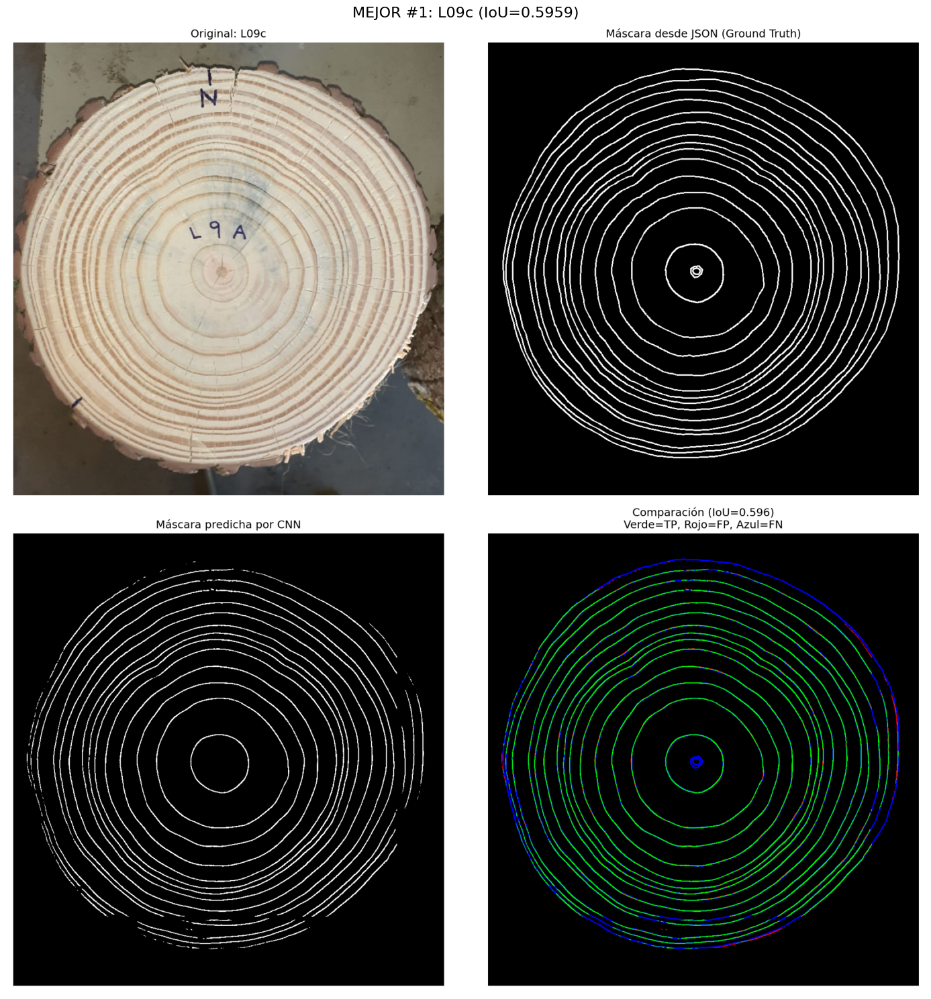


2. L09d (IoU=0.5880)


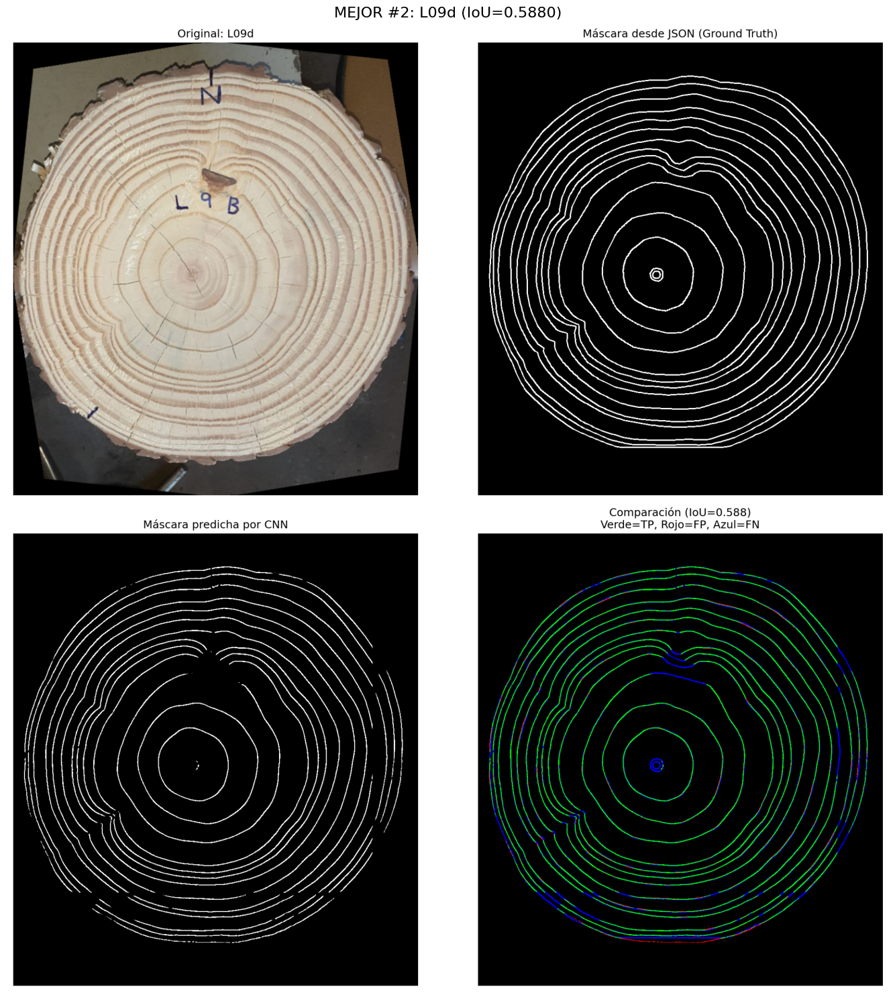


3. F04d (IoU=0.5877)


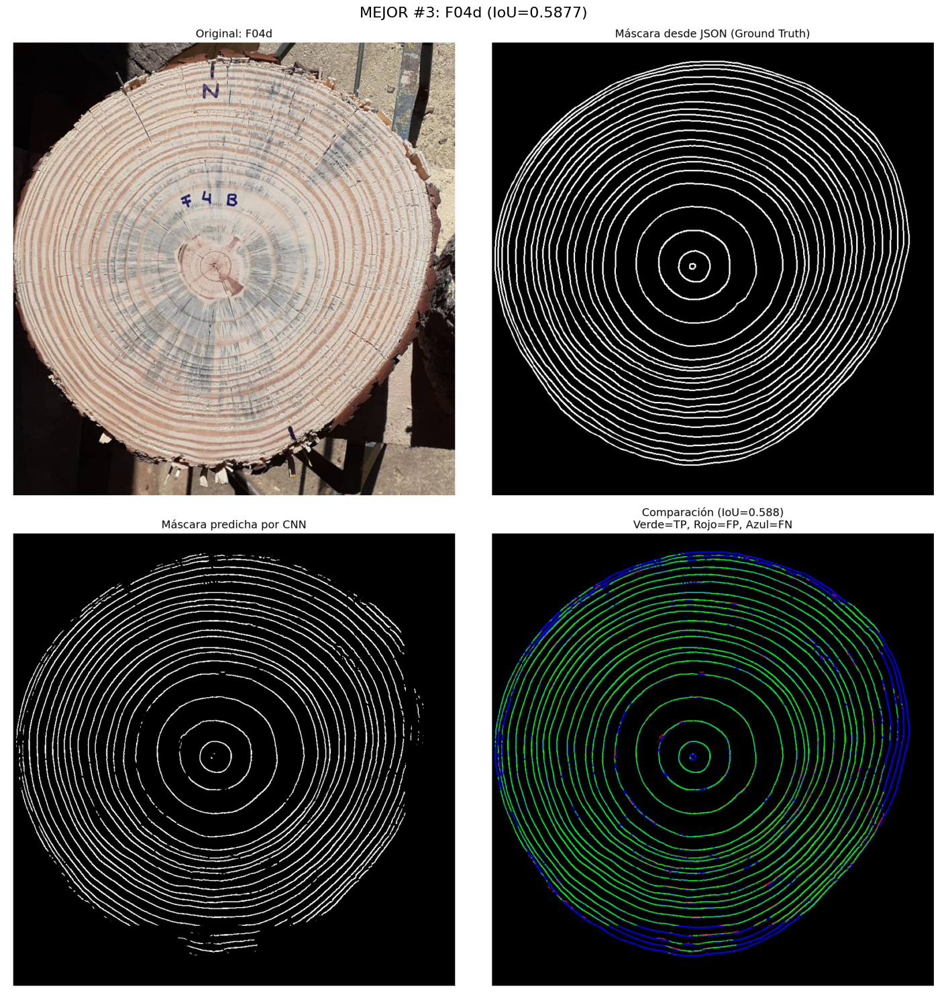


❌ TOP 2 PEORES DETECCIONES:

1. F09d (IoU=0.0573)


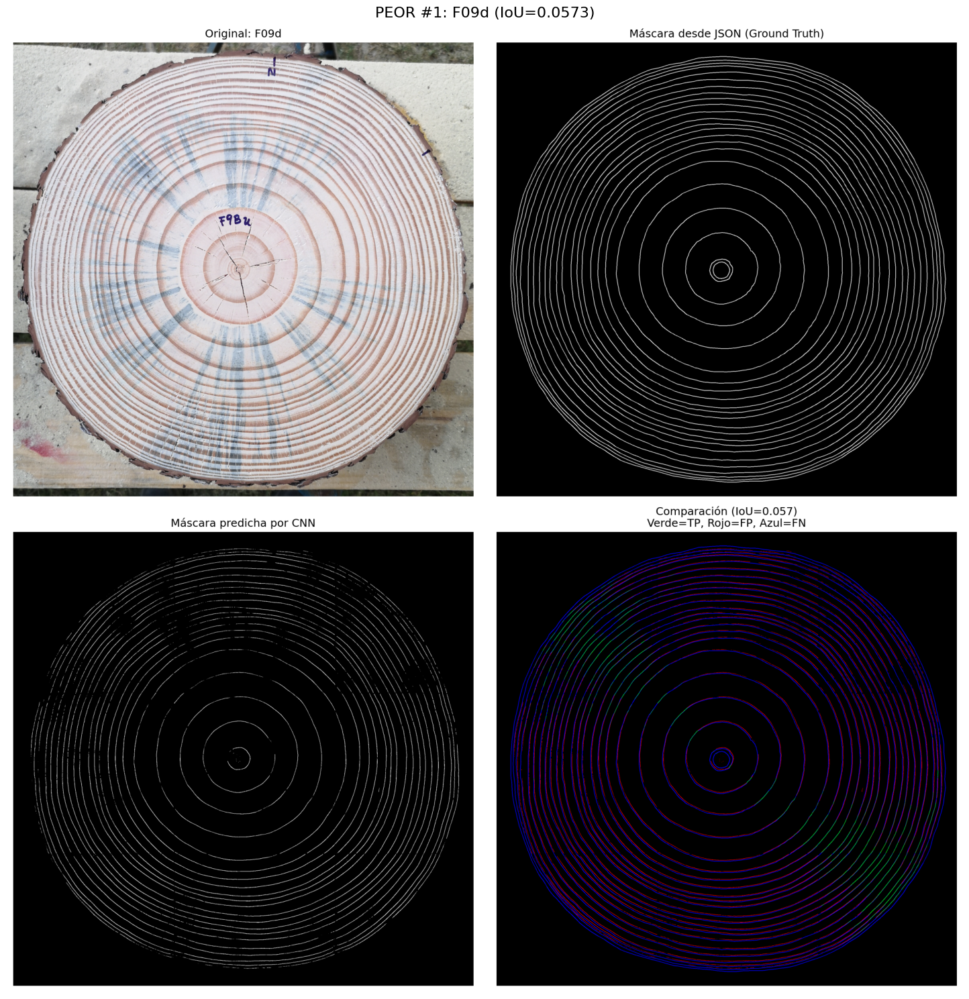


2. F07e (IoU=0.0495)


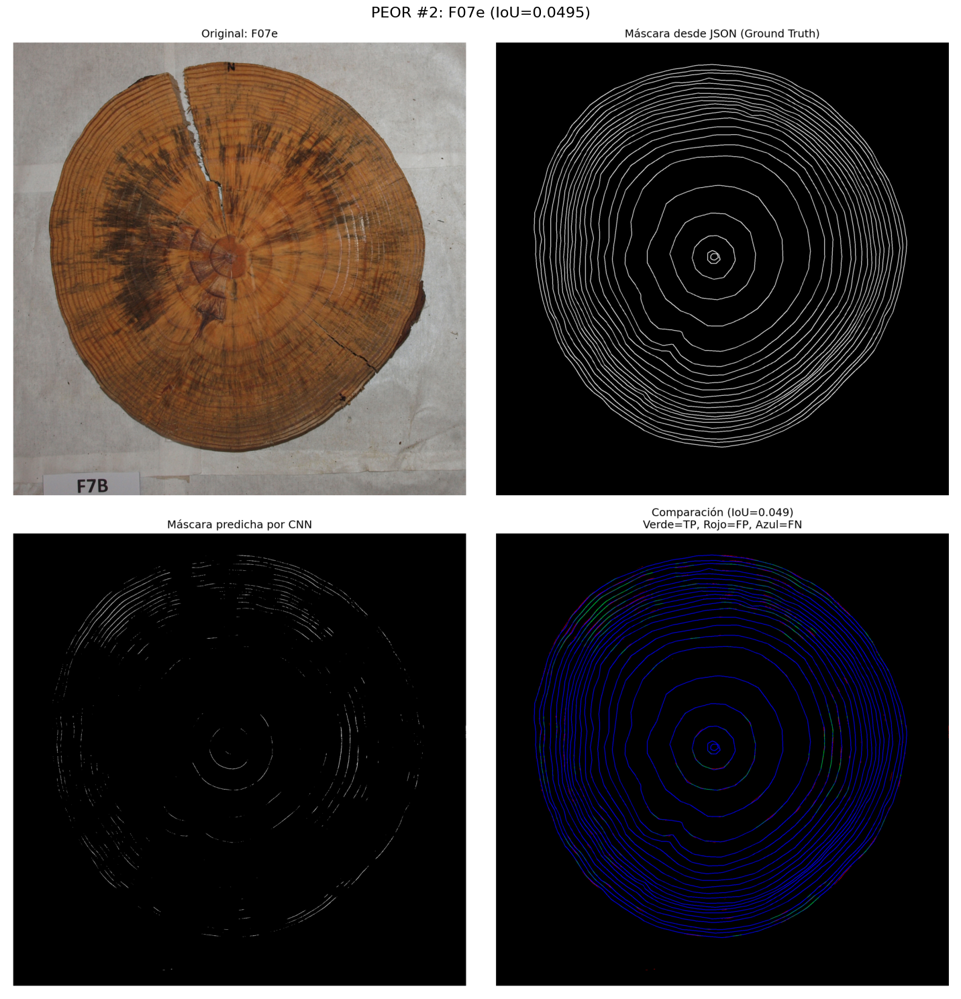

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os

print("="*70)
print("VISUALIZANDO RESULTADOS")
print("="*70)

# Obtener lista de imágenes guardadas
visualization_files = sorted([f for f in os.listdir(OUTPUT_DIR) if f.endswith('_comparison.png')])

print(f"\n✅ Se generaron {len(visualization_files)} visualizaciones")
print(f"📁 Ubicación: {OUTPUT_DIR}/")

# Mostrar los TOP 3 mejores y TOP 2 peores
df_success_sorted = df_results[df_results['success'] == True].sort_values('iou', ascending=False)

best_3 = df_success_sorted.head(3)['parent_id'].tolist()
worst_2 = df_success_sorted.tail(2)['parent_id'].tolist()

print(f"\n📊 Mostrando mejores y peores resultados:\n")

# Función para mostrar una imagen
def show_comparison(parent_id, iou_value, title_prefix):
    img_path = f'{OUTPUT_DIR}/{parent_id}_comparison.png'
    if os.path.exists(img_path):
        img = imread(img_path)
        plt.figure(figsize=(15, 15))
        plt.imshow(img)
        plt.title(f'{title_prefix}: {parent_id} (IoU={iou_value:.4f})', fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"   ⚠️  No se encontró visualización para {parent_id}")

# Mostrar TOP 3 mejores
print("✅ TOP 3 MEJORES DETECCIONES:")
for i, parent_id in enumerate(best_3, 1):
    iou_val = df_success_sorted[df_success_sorted['parent_id'] == parent_id]['iou'].values[0]
    print(f"\n{i}. {parent_id} (IoU={iou_val:.4f})")
    show_comparison(parent_id, iou_val, f"MEJOR #{i}")

# Mostrar TOP 2 peores
print("\n❌ TOP 2 PEORES DETECCIONES:")
for i, parent_id in enumerate(worst_2, 1):
    iou_val = df_success_sorted[df_success_sorted['parent_id'] == parent_id]['iou'].values[0]
    print(f"\n{i}. {parent_id} (IoU={iou_val:.4f})")
    show_comparison(parent_id, iou_val, f"PEOR #{i}")

print("\n" + "="*70)

CARGANDO HISTORIAL DE ENTRENAMIENTO
✅ Encontrado: /content/drive/MyDrive/tree_rings_models/backup_/training_history.pkl

✅ Datos de entrenamiento cargados:
   - Fase 1 (Backbone congelado): 20 épocas
   - Fase 2 (Fine-tuning): 11 épocas

💾 Gráfica guardada en: /content/results/training_curves.png


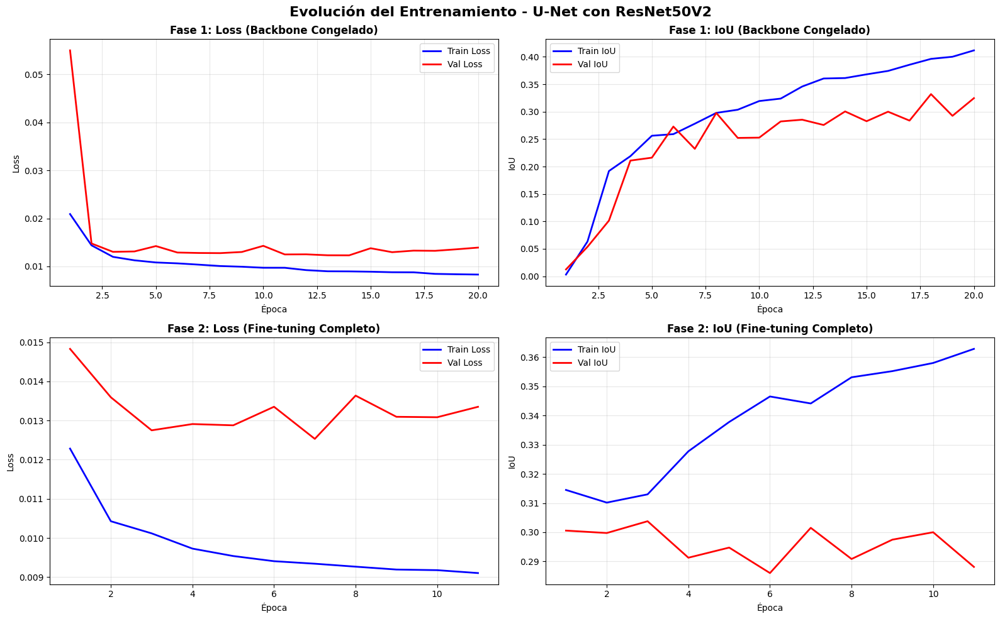


📊 RESUMEN DEL ENTRENAMIENTO:

Fase 1 (Backbone Congelado):
   - Mejor Val IoU: 0.3321
   - Menor Val Loss: 0.0123

Fase 2 (Fine-tuning):
   - Mejor Val IoU: 0.3038
   - Menor Val Loss: 0.0125


In [ ]:
import pickle
import matplotlib.pyplot as plt

print("="*70)
print("CARGANDO HISTORIAL DE ENTRENAMIENTO")
print("="*70)

# Buscar el archivo de historial en Drive
history_files = []
backup_dirs = [d for d in os.listdir(DRIVE_MODEL_DIR) if d.startswith('backup_')]

for backup_dir in backup_dirs:
    history_path = f'{DRIVE_MODEL_DIR}/{backup_dir}/training_history.pkl'
    if os.path.exists(history_path):
        history_files.append(history_path)

if len(history_files) == 0:
    print("❌ No se encontró archivo training_history.pkl")
    print("⚠️  Necesitas el archivo que se guardó durante el entrenamiento.")
else:
    # Usar el más reciente
    history_path = sorted(history_files)[-1]
    print(f"✅ Encontrado: {history_path}")

    # Cargar historial
    with open(history_path, 'rb') as f:
        history_data = pickle.load(f)

    phase1 = history_data.get('phase1')
    phase2 = history_data.get('phase2')

    print(f"\n✅ Datos de entrenamiento cargados:")
    if phase1:
        print(f"   - Fase 1 (Backbone congelado): {len(phase1['loss'])} épocas")
    if phase2:
        print(f"   - Fase 2 (Fine-tuning): {len(phase2['loss'])} épocas")

    # Graficar
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle('Evolución del Entrenamiento - U-Net con ResNet50V2', fontsize=16, fontweight='bold')

    # --- FASE 1 ---
    if phase1:
        epochs_p1 = range(1, len(phase1['loss']) + 1)

        # Loss Fase 1
        axes[0, 0].plot(epochs_p1, phase1['loss'], 'b-', label='Train Loss', linewidth=2)
        axes[0, 0].plot(epochs_p1, phase1['val_loss'], 'r-', label='Val Loss', linewidth=2)
        axes[0, 0].set_title('Fase 1: Loss (Backbone Congelado)', fontweight='bold')
        axes[0, 0].set_xlabel('Época')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)

        # IoU Fase 1
        axes[0, 1].plot(epochs_p1, phase1['iou_anillos'], 'b-', label='Train IoU', linewidth=2)
        axes[0, 1].plot(epochs_p1, phase1['val_iou_anillos'], 'r-', label='Val IoU', linewidth=2)
        axes[0, 1].set_title('Fase 1: IoU (Backbone Congelado)', fontweight='bold')
        axes[0, 1].set_xlabel('Época')
        axes[0, 1].set_ylabel('IoU')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)

    # --- FASE 2 ---
    if phase2:
        epochs_p2 = range(1, len(phase2['loss']) + 1)

        # Loss Fase 2
        axes[1, 0].plot(epochs_p2, phase2['loss'], 'b-', label='Train Loss', linewidth=2)
        axes[1, 0].plot(epochs_p2, phase2['val_loss'], 'r-', label='Val Loss', linewidth=2)
        axes[1, 0].set_title('Fase 2: Loss (Fine-tuning Completo)', fontweight='bold')
        axes[1, 0].set_xlabel('Época')
        axes[1, 0].set_ylabel('Loss')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)

        # IoU Fase 2
        axes[1, 1].plot(epochs_p2, phase2['iou_anillos'], 'b-', label='Train IoU', linewidth=2)
        axes[1, 1].plot(epochs_p2, phase2['val_iou_anillos'], 'r-', label='Val IoU', linewidth=2)
        axes[1, 1].set_title('Fase 2: IoU (Fine-tuning Completo)', fontweight='bold')
        axes[1, 1].set_xlabel('Época')
        axes[1, 1].set_ylabel('IoU')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()

    # Guardar gráfica
    plot_path = f'{OUTPUT_DIR}/training_curves.png'
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"\n💾 Gráfica guardada en: {plot_path}")
    plt.show()

    print("\n📊 RESUMEN DEL ENTRENAMIENTO:")
    if phase1:
        print(f"\nFase 1 (Backbone Congelado):")
        print(f"   - Mejor Val IoU: {max(phase1['val_iou_anillos']):.4f}")
        print(f"   - Menor Val Loss: {min(phase1['val_loss']):.4f}")
    if phase2:
        print(f"\nFase 2 (Fine-tuning):")
        print(f"   - Mejor Val IoU: {max(phase2['val_iou_anillos']):.4f}")
        print(f"   - Menor Val Loss: {min(phase2['val_loss']):.4f}")

print("="*70)